# Importing relevant packages
<ul>
    <li>scipy.cluster.hierarchy library provides tools for hierarchical clustering which is what is going to be used here.</li>
    <li>Validators is to ensure that if the tweet is just a URL to not translate it.</li>
    <li>Other packages like demoji,WordNetLemmatizer is for pre-processing </li>
</ul>

In [3]:
!pip install validators

  Preparing metadata (setup.py) ... done
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19583 sha256=bd7907a445a9721b8ce203f12dd7055445848a924df6b135001de3254adcfb4b
  Stored in directory: /Users/eileengoh/Library/Caches/pip/wheels/5c/6a/fd/17a2b6f8d376e336d46414eeaf656327fd973158159b059046
Successfully built validators


In [6]:
!pip install demoji

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 1.4 MB/s eta 0:00:00


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ast
import validators
import string
import demoji
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from scipy.cluster.hierarchy import dendrogram, linkage
from nltk.stem import WordNetLemmatizer

In [2]:
import sys
sys.setrecursionlimit(100000)

In [3]:
def DFToDocument(df):
    document = []
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    for i, row in df.iterrows():
        sentence = ""
        tokenized_text = ast.literal_eval(row['tokenized_text'])
        for token in tokenized_text:
            if token not in stop_words and not validators.url(token) and token not in string.punctuation:
                sentence += token + ' '
        sentence = demoji.replace_with_desc(string = sentence, sep = ":")
        document.append(sentence[:-1])
    return document

In [4]:
df = pd.read_csv('translated_tokenized/translated_dataframe.csv')
DFsplit = np.array_split(df, 300)
DFsplitFinal = np.array_split(df, 6)

In [5]:
document = DFToDocument(DFsplit[0])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()


<h1> Run Silhouette Score to determine linkage method 

In [28]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

all_score = 0

for i in range(2,15):
    
    # Fit the hierarchical clustering model
    model = AgglomerativeClustering(n_clusters=i, linkage='single')
    labels = model.fit_predict(word_matrix)
    
    # Calculate the silhouette score
    silhouette_avg = silhouette_score(word_matrix, labels)
    all_score += silhouette_avg


    print(f"For {i} clusters, The average silhouette_score is :", silhouette_avg)
average_score = all_score/13
print(f"Average score from cluster 2-14: {average_score}")

For 2 clusters, The average silhouette_score is : 0.36670515234929124
For 3 clusters, The average silhouette_score is : 0.32971233090829527
For 4 clusters, The average silhouette_score is : 0.31532551751330196
For 5 clusters, The average silhouette_score is : 0.30226024908310706
For 6 clusters, The average silhouette_score is : 0.2758879837002557
For 7 clusters, The average silhouette_score is : 0.26640852992952885
For 8 clusters, The average silhouette_score is : 0.2573673906359815
For 9 clusters, The average silhouette_score is : 0.24481530739529914
For 10 clusters, The average silhouette_score is : 0.24036860524971496
For 11 clusters, The average silhouette_score is : 0.2291443830898395
For 12 clusters, The average silhouette_score is : 0.22477284342162812
For 13 clusters, The average silhouette_score is : 0.2248586773349048
For 14 clusters, The average silhouette_score is : 0.21541719808748214
Average score from cluster 2-14: 0.26869570528451


In [29]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

all_score = 0

for i in range(2,15):
    
    # Fit the hierarchical clustering model
    model = AgglomerativeClustering(n_clusters=i, linkage='average')
    labels = model.fit_predict(word_matrix)

    # Calculate the silhouette score
    silhouette_avg = silhouette_score(word_matrix, labels)
    all_score += silhouette_avg


    print(f"For {i} clusters, The average silhouette_score is :", silhouette_avg)
average_score = all_score/13
print(f"Average score from cluster 2-14: {average_score}")

For 2 clusters, The average silhouette_score is : 0.36670515234929124
For 3 clusters, The average silhouette_score is : 0.32971233090829527
For 4 clusters, The average silhouette_score is : 0.31532551751330196
For 5 clusters, The average silhouette_score is : 0.30226024908310706
For 6 clusters, The average silhouette_score is : 0.2758879837002557
For 7 clusters, The average silhouette_score is : 0.26640852992952885
For 8 clusters, The average silhouette_score is : 0.2573673906359815
For 9 clusters, The average silhouette_score is : 0.24291214837772668
For 10 clusters, The average silhouette_score is : 0.24036860524971496
For 11 clusters, The average silhouette_score is : 0.2291443830898395
For 12 clusters, The average silhouette_score is : 0.22912748835931437
For 13 clusters, The average silhouette_score is : 0.2248586773349048
For 14 clusters, The average silhouette_score is : 0.21862148690905364
Average score from cluster 2-14: 0.26913076488002424


In [30]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

all_score = 0

for i in range(2,15):
    
    # Fit the hierarchical clustering model
    model = AgglomerativeClustering(n_clusters=i, linkage='complete')
    labels = model.fit_predict(word_matrix)

    # Calculate the silhouette score
    silhouette_avg = silhouette_score(word_matrix, labels)
    all_score += silhouette_avg


    print(f"For {i} clusters, The average silhouette_score is :", silhouette_avg)
average_score = all_score/13
print(f"Average score from cluster 2-14: {average_score}")

For 2 clusters, The average silhouette_score is : 0.36670515234929124
For 3 clusters, The average silhouette_score is : 0.315731034883101
For 4 clusters, The average silhouette_score is : 0.31532551751330196
For 5 clusters, The average silhouette_score is : 0.30226024908310706
For 6 clusters, The average silhouette_score is : 0.2758879837002557
For 7 clusters, The average silhouette_score is : 0.2632300095005695
For 8 clusters, The average silhouette_score is : 0.15902747262743355
For 9 clusters, The average silhouette_score is : 0.1584313832927374
For 10 clusters, The average silhouette_score is : 0.16088927014103147
For 11 clusters, The average silhouette_score is : 0.1622979275841371
For 12 clusters, The average silhouette_score is : 0.15583620484278413
For 13 clusters, The average silhouette_score is : 0.15692972220859644
For 14 clusters, The average silhouette_score is : 0.15811819701851978
Average score from cluster 2-14: 0.22697462498037432


In [31]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

all_score = 0

for i in range(2,15):
    
    # Fit the hierarchical clustering model
    model = AgglomerativeClustering(n_clusters=i, linkage='ward')
    labels = model.fit_predict(word_matrix)

    # Calculate the silhouette score
    silhouette_avg = silhouette_score(word_matrix, labels)
    all_score += silhouette_avg

    print(f"For {i} clusters, The average silhouette_score is :", silhouette_avg)

average_score = all_score/13
print(f"Average score from cluster 2-14: {average_score}")

For 2 clusters, The average silhouette_score is : 0.36670515234929124
For 3 clusters, The average silhouette_score is : 0.12798426855714248
For 4 clusters, The average silhouette_score is : 0.141139689173205
For 5 clusters, The average silhouette_score is : 0.13681178222341955
For 6 clusters, The average silhouette_score is : 0.13917707299252047
For 7 clusters, The average silhouette_score is : 0.1346234109678618
For 8 clusters, The average silhouette_score is : 0.13476979357449406
For 9 clusters, The average silhouette_score is : 0.13648278691537008
For 10 clusters, The average silhouette_score is : 0.13294886555294846
For 11 clusters, The average silhouette_score is : 0.13250305852228228
For 12 clusters, The average silhouette_score is : 0.1339953877617404
For 13 clusters, The average silhouette_score is : 0.13073023021890984
For 14 clusters, The average silhouette_score is : 0.12784494137928815
Average score from cluster 2-14: 0.15197818770680566


<h1> Dendrograms

<h2> Dendrograms for 4 linkage with the first set of data DFToDocument(DFsplit[0])

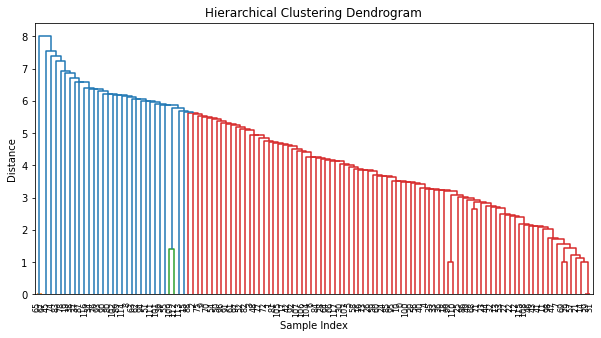

In [7]:
document = DFToDocument(DFsplit[0])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'average')

plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, leaf_rotation=90., leaf_font_size=8.)
plt.show()

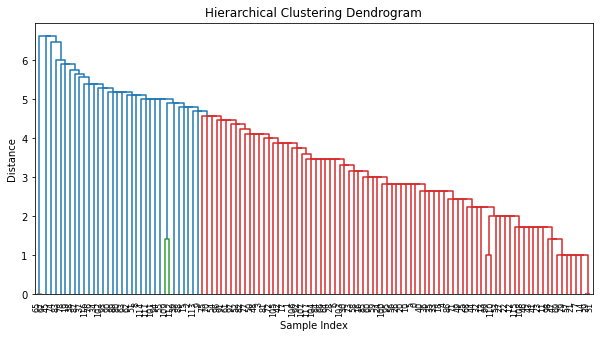

In [8]:
document = DFToDocument(DFsplit[0])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'single')

plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, leaf_rotation=90., leaf_font_size=8.)
plt.show()

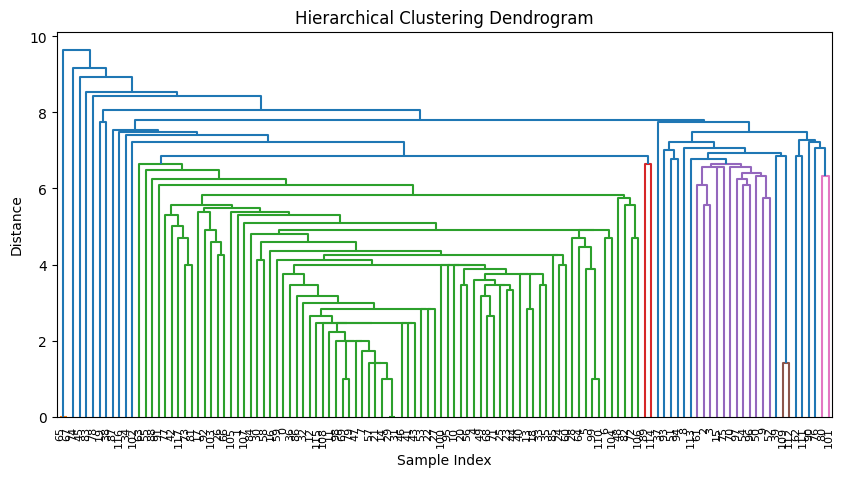

In [7]:
document = DFToDocument(DFsplit[0])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'complete')

plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, leaf_rotation=90., leaf_font_size=8.)
plt.show()

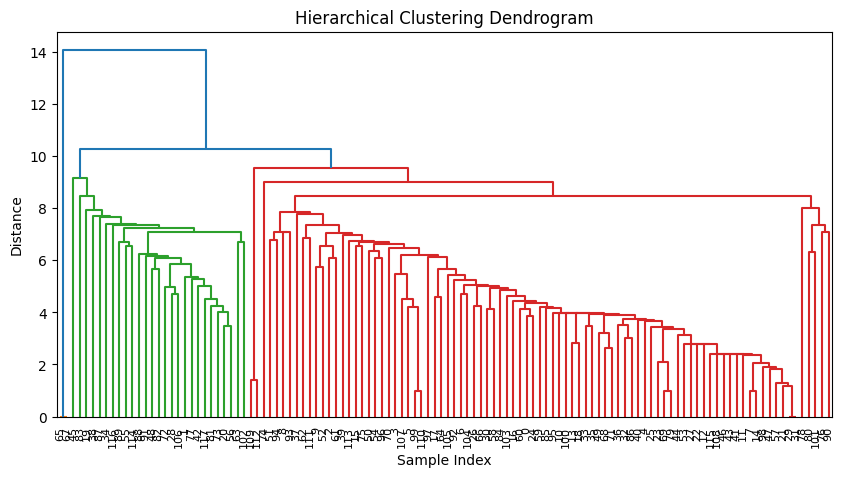

In [8]:
document = DFToDocument(DFsplit[0])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'ward')

plt.figure(figsize=(10, 5))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, leaf_rotation=90., leaf_font_size=8.)
plt.show()

<h2> Average Linkage

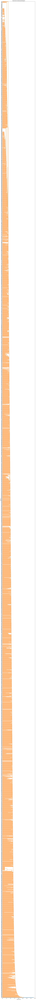

In [9]:
document = DFToDocument(DFsplitFinal[0])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'average')

plt.figure(figsize=(10, 300))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, orientation="right")
plt.show()
# 5

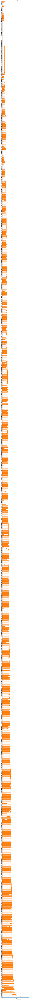

In [10]:
document = DFToDocument(DFsplitFinal[1])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'average')

plt.figure(figsize=(10, 300))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, orientation="right")
plt.show()
# 3

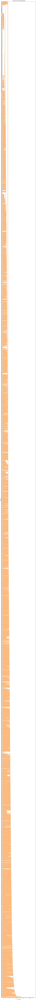

In [11]:
document = DFToDocument(DFsplitFinal[2])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'average')

plt.figure(figsize=(10, 300))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, orientation="right")
plt.show()
# 7

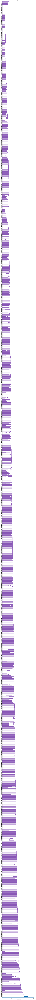

In [12]:
document = DFToDocument(DFsplitFinal[3])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'average')

plt.figure(figsize=(10, 300))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, orientation="right")
plt.show()
# 6

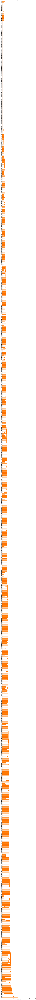

In [13]:
document = DFToDocument(DFsplitFinal[4])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'average')

plt.figure(figsize=(10, 300))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, orientation="right")
plt.show()
# 3

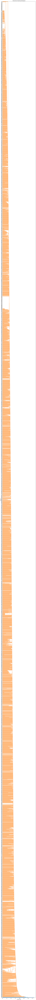

In [14]:
document = DFToDocument(DFsplitFinal[5])
vectorizer = CountVectorizer()
word_matrix = vectorizer.fit_transform(document).toarray()
h_cluster = linkage(word_matrix, 'average')

plt.figure(figsize=(10, 300))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
dendrogram(h_cluster, orientation="right")
plt.show()
# 8